In [1]:
import requests
import numpy as np
import pandas as pd


In [9]:
def get_deployments():
    '''Retrieve a table of all sensor deployment locations.

    '''
    # query the API
    deployments = requests.get("https://api.dev.floodlabs.nyc/api/rest/deployments/flood").json()
    if 'error' in deployments:
        raise RuntimeError(str(deployments))

    # create a pandas table
    df = pd.DataFrame(deployments['deployments'])

    # drop any sensors without a location (TODO: do this within the query)
    df = df.dropna(subset=['location'])

    # convert date strings to datetime objects
    # df['date_deployed'] = pd.to_datetime(df.date_deployed)
    # df['date_down'] = pd.to_datetime(df.date_down)

    # extract latitude, longitude pair
    df['coordinates'] = [np.array(x['coordinates'][::-1]) for x in df.location]
    return df

In [10]:
# get a dataframe of flood deployments
df_deployments = get_deployments()


In [11]:
df_deployments

,name,deployment_id,date_deployed,date_down,deploy_type,location,image,sensor_mount,mounted_over,sensor_status,coordinates
0,Q - 126th St/109th Ave,fluffy-white-penguin,2024-09-06T03:38:00,None,pluvial,"{'type': 'Point', 'crs': {'type': 'name', 'pro...",a60f6e36-bf23-4802-a743-4dfd904f3278,streetsign-post,sidewalk,good,"[40.68397740522016, -73.81594872825937]"
1,BX - Edgewater Rd/Seneca Ave,yearly-hardy-sloth,2024-08-22T14:08:00,None,pluvial,"{'type': 'Point', 'crs': {'type': 'name', 'pro...",98a154c6-3b8e-40aa-b06a-acc18bf25ed0,streetsign-post,sidewalk,good,"[40.819327211645174, -73.88379017356341]"
2,M - Broadway/W 157th St,truly_chief_deer,2024-05-10T00:00:00,None,pluvial,"{'type': 'Point', 'crs': {'type': 'name', 'pro...",None,streetsign post,sidewalk,low_charge,"[40.834239, -73.945121]"
3,BK - 35th St/3rd Ave,poorly_set_cougar,2024-08-07T03:38:00,None,pluvial,"{'type': 'Point', 'crs': {'type': 'name', 'pro...",1035dc55-7950-4c54-b905-a2fbe477bd23,streetsign-post,sidewalk,good,"[40.65560565057419, -74.00496686951207]"
4,BK - Knickerbocker Ave/Palmetto St,generally_enormous_panda,2023-11-16T00:00:00,None,pluvial,"{'type': 'Point', 'crs': {'type': 'name', 'pro...",None,streetsign post,sidewalk,good,"[40.69629627, -73.91379]"
...,...,...,...,...,...,...,...,...,...,...,...
224,BK - Henry St/Mill St,jolly_tender_squid,2022-02-18T00:00:00,None,pluvial,"{'type': 'Point', 'crs': {'type': 'name', 'pro...",None,streetsign post,sidewalk,good,"[40.67573424, -74.00339626]"
225,BK - Flatlands 8th St/E 108th St,widely_comic_insect,2024-04-18T00:00:00,None,pluvial,"{'type': 'Point', 'crs': {'type': 'name', 'pro...",None,streetsign post,sidewalk,good,"[40.64090807, -73.88456498]"
226,SI - Bedford Ave/Kiswick St,widely_mint_rabbit,2023-09-07T00:00:00,None,coastal,"{'type': 'Point', 'crs': {'type': 'name', 'pro...",None,streetsign post,sidewalk,good,"[40.575318, -74.095266]"
227,BK - Morgan Ave/Johnson Ave,widely_whole_tarpon,2023-06-02T00:00:00,None,pluvial,"{'type': 'Point', 'crs': {'type': 'name', 'pro...",None,streetsign post,sidewalk,good,"[40.7078606, -73.9324263]"


In [19]:
sensor_name_lookup = df_deployments.set_index('deployment_id').name
def query_depth_data(deployment_id, start_time, end_time):
    data = requests.get(f"https://api.dev.floodlabs.nyc/api/rest/deployments/flood/{deployment_id}/depth", params={
        'start_time': start_time,
        'end_time': end_time,
    }).json()
    if 'error' in data:
        raise RuntimeError(data)
    print(data)
    # lets create a pandas dataframe
    df_depth = pd.DataFrame(data['depth_data'], columns=['deployment_id', 'time', 'depth_proc_mm'])

    # drop missing depth values
    df_depth = df_depth.dropna(subset=['depth_proc_mm'])

    # add the sensor name to the table
    df_depth['name'] = df_depth.deployment_id.apply(lambda name: sensor_name_lookup.get(name))

    # convert the time string to a datetime object
    df_depth['time'] = pd.to_datetime(df_depth['time'], format='ISO8601')

    # convert millimeters to inches
    df_depth['depth_inches'] = df_depth['depth_proc_mm'] / 25.4
    
    # use time as the dataframe index
    # df_depth = df_depth.set_index('time')
    return df_depth

def query_depth_data_for_multiple_deployments(df, start_time, end_time):
    # filter out sensors that were not online during the event
    df_active = df
    #  [
    #     (df.date_deployed < pd.to_datetime(start_time))
    # ]

    # query depth data for all sensors
    df_depth = pd.concat([
        query_depth_data(deployment_id, start_time, end_time)
        for deployment_id in df_active.deployment_id
    ])

    return df_depth

In [20]:
df_depth = query_depth_data_for_multiple_deployments(df_deployments,"2023-09-28T14:00:00-04:00","2023-09-30T14:00:00-04:00")

{'depth_data': []}
{'depth_data': []}
{'depth_data': []}
{'depth_data': []}
{'depth_data': []}
{'depth_data': [{'deployment_id': 'gladly_pretty_magpie', 'time': '2023-09-28T18:01:13.103+00:00', 'depth_proc_mm': 0}, {'deployment_id': 'gladly_pretty_magpie', 'time': '2023-09-28T18:02:15.833+00:00', 'depth_proc_mm': 0}, {'deployment_id': 'gladly_pretty_magpie', 'time': '2023-09-28T18:03:18.679+00:00', 'depth_proc_mm': 0}, {'deployment_id': 'gladly_pretty_magpie', 'time': '2023-09-28T18:05:24.822+00:00', 'depth_proc_mm': 0}, {'deployment_id': 'gladly_pretty_magpie', 'time': '2023-09-28T18:06:27.798+00:00', 'depth_proc_mm': 0}, {'deployment_id': 'gladly_pretty_magpie', 'time': '2023-09-28T18:09:36.587+00:00', 'depth_proc_mm': 0}, {'deployment_id': 'gladly_pretty_magpie', 'time': '2023-09-28T18:10:39.567+00:00', 'depth_proc_mm': 0}, {'deployment_id': 'gladly_pretty_magpie', 'time': '2023-09-28T18:11:42.872+00:00', 'depth_proc_mm': 0}, {'deployment_id': 'gladly_pretty_magpie', 'time': '2023-0

/tmp/ipykernel_9937/1950976215.py:37: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_depth = pd.concat([


In [16]:
import seaborn as sns
df_depth.time = pd.to_datetime(df_depth.time)

In [35]:
df_depth['time'] = df_depth['time'].dt.floor('T')

In [36]:
df_depth.sort_values('time')

,deployment_id,time,depth_proc_mm,name,depth_inches
0,vastly_select_guinea,2023-09-28 18:00:00+00:00,0.0,Q - Brookville Blvd/147 Ave,0.0
0,random_stuck_buffalo,2023-09-28 18:00:00+00:00,0.0,Q - Beach 72nd St/Almeda Ave,0.0
0,slowly_fast_sawfly,2023-09-28 18:00:00+00:00,0.0,BX - Sheridan Bl/173rd St,0.0
0,mean_flying_fish,2023-09-28 18:00:00+00:00,0.0,BK - Wallabout St/Throop Ave,0.0
0,blue_eyed_tiger,2023-09-28 18:00:00+00:00,0.0,BK - Lee Ave/Middleton St,0.0
...,...,...,...,...,...
2663,closed_wagon_snail,2023-09-30 17:59:00+00:00,0.0,BK - Marcy Ave/Flushing Ave,0.0
2718,overly_heroic_squid,2023-09-30 17:59:00+00:00,0.0,BK - 9th St/Smith St,0.0
1539,clearly_bored_turtle,2023-09-30 17:59:00+00:00,0.0,BK - Walton St/Marcy Ave,0.0
2284,widely_mint_rabbit,2023-09-30 17:59:00+00:00,0.0,SI - Bedford Ave/Kiswick St,0.0


<Axes: xlabel='time', ylabel='depth_inches'>

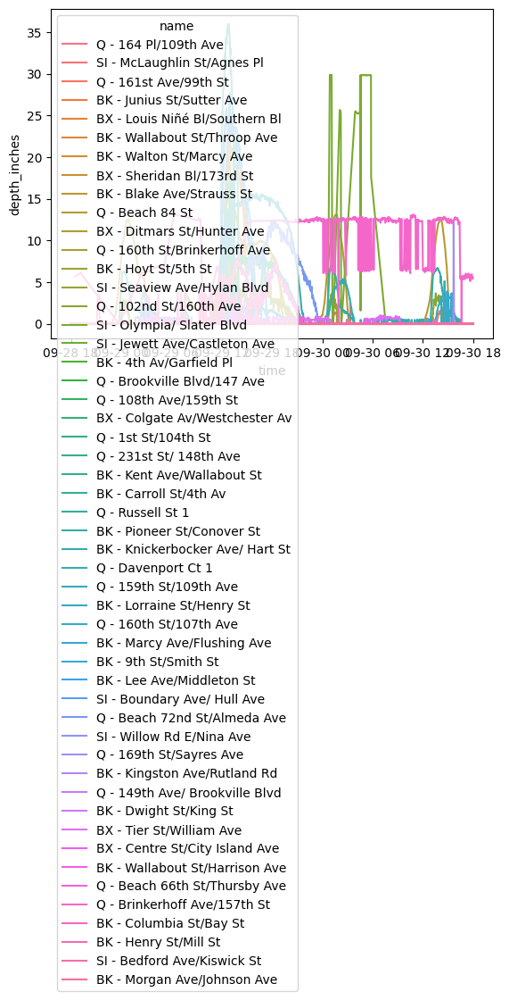

In [37]:
sns.lineplot(df_depth,x='time',y='depth_inches',hue='name')

In [40]:
df_depth.dtypes

deployment_id                 object
time             datetime64[ns, UTC]
depth_proc_mm                float64
name                          object
depth_inches                 float64
dtype: object

In [46]:
df_depth.time.dt.date

0       2023-09-28
1       2023-09-28
2       2023-09-28
3       2023-09-28
4       2023-09-28
           ...    
2685    2023-09-30
2686    2023-09-30
2687    2023-09-30
2688    2023-09-30
2689    2023-09-30
Name: time, Length: 95678, dtype: object

In [57]:
df_depth['date'] = df_depth.time.dt.strftime('%Y-%m-%d')
df_depth['hour'] = df_depth.time.dt.hour.astype(str)

In [58]:
df_depth_avg = df_depth.groupby(['name','date','hour']).agg(avg_flood=pd.NamedAgg(column="depth_inches", aggfunc="mean")).reset_index()

In [59]:
df_depth_avg.dtypes

name          object
date          object
hour          object
avg_flood    float64
dtype: object

In [60]:
df_depth_avg['time_dh'] = pd.to_datetime(df_depth_avg['date'] + ' ' + df_depth_avg['hour']+':00:00')

<Axes: xlabel='time_dh', ylabel='avg_flood'>

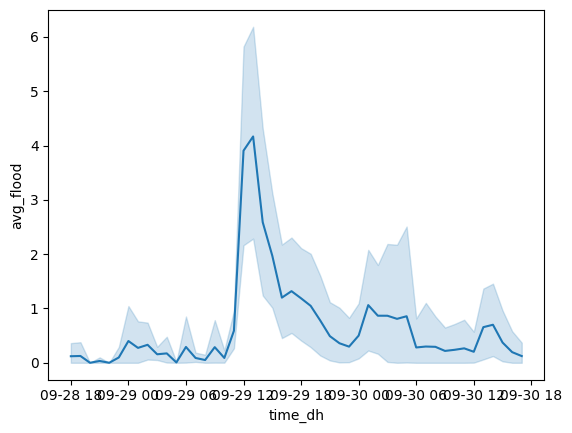

In [63]:
sns.lineplot(df_depth_avg,x='time_dh',y='avg_flood')

In [65]:
df_depth_avg = df_depth_avg.merge(df_deployments[['name','coordinates']],how='left',on='name')

,name,date,hour,avg_flood,time_dh,coordinates
0,BK - 4th Av/Garfield Pl,2023-09-28,18,0.0,2023-09-28 18:00:00,"[40.67585478, -73.98394371]"
1,BK - 4th Av/Garfield Pl,2023-09-28,19,0.0,2023-09-28 19:00:00,"[40.67585478, -73.98394371]"
2,BK - 4th Av/Garfield Pl,2023-09-28,20,0.0,2023-09-28 20:00:00,"[40.67585478, -73.98394371]"
3,BK - 4th Av/Garfield Pl,2023-09-28,21,0.0,2023-09-28 21:00:00,"[40.67585478, -73.98394371]"
4,BK - 4th Av/Garfield Pl,2023-09-28,22,0.0,2023-09-28 22:00:00,"[40.67585478, -73.98394371]"
...,...,...,...,...,...,...
2432,SI - Willow Rd E/Nina Ave,2023-09-30,5,0.0,2023-09-30 05:00:00,"[40.61133023, -74.1510578]"
2433,SI - Willow Rd E/Nina Ave,2023-09-30,6,0.0,2023-09-30 06:00:00,"[40.61133023, -74.1510578]"
2434,SI - Willow Rd E/Nina Ave,2023-09-30,7,0.0,2023-09-30 07:00:00,"[40.61133023, -74.1510578]"
2435,SI - Willow Rd E/Nina Ave,2023-09-30,8,0.0,2023-09-30 08:00:00,"[40.61133023, -74.1510578]"


In [66]:
df_depth_avg = df_depth_avg.rename(columns={'avg_flood':'avg_flood_inches'})


In [67]:
df_depth_avg.to_parquet('/home/data/bus-weather/Floodnet_hourly_average_Sep28_to_Sep30.parquet')
df_depth.to_parquet('/home/data/bus-weather/Floodnet_raw_data_Sep28_to_Sep30.parquet')
df_deployments.to_parquet('/home/data/bus-weather/Floodnet_locations.parquet')